In [1]:
from __future__ import print_function
import os
import sys
import cv2
import math
import pickle
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import ConnectionPatch
import tensorflow as tf
from collections import namedtuple
import importlib
import inspect
from collections import namedtuple
from scipy import misc
import time
import glob
from imageio import imread, imsave
print('USE GPU #{} Host={}'.format(os.environ.get('CUDA_VISIBLE_DEVICES'), os.uname()[1]))

USE GPU #None Host=Dewals-MacBook-Pro-2.local


In [2]:
LOCAL_PATH = '../'
if LOCAL_PATH not in sys.path:
    sys.path.append(LOCAL_PATH)
from common.tf_layer_utils import *
from mydatasets import *
from det_tools import *
from inference import *
MODEL_PATH = '../models/'
if MODEL_PATH not in sys.path:
    sys.path.append(MODEL_PATH)
COMMON_PATH = '../common/'
if COMMON_PATH not in sys.path:
    sys.path.append(COMMON_PATH)
    
from io_utils import read_text
# from jupyter_utils import display_image_batch

In [3]:
given_config = namedtuple('params', 'model')
base_dir = '/Users/dewalgupta/Documents/ucsd/lab/slam/lf-net-release/'
given_config.model = base_dir + 'release/models/outdoor/'
given_config.top_k = 512
yfcc_dir = os.path.join(base_dir, 'release/outdoor_examples/')
given_config.img_dir = os.path.join(yfcc_dir, 'images')
given_config.dpt_dir = os.path.join(yfcc_dir, 'depths')
given_config.seq_names = ['sacre_coeur']
given_config.dist_thresh = 5

In [4]:
# load config file
config_path = os.path.join(given_config.model, 'config.pkl')
try:
    with open(config_path, 'rb') as f:
        config = pickle.load(f, encoding='latin1')
except:
    raise ValueError('Fail to open {}'.format(config_path))

# overwrite each given_config parameters
for attr, dst_val in sorted(vars(given_config).items()):
    if attr.startswith('_'):
        continue
    elif hasattr(config, attr):
        src_val = getattr(config, attr)
        if src_val != dst_val:
            print('Overwrite {} : {} --> {}'.format(attr, src_val, dst_val))
            setattr(config, attr, dst_val)
    else:
        print('Add {} {}'.format(attr, dst_val))
        setattr(config, attr, dst_val)

Add dist_thresh 5
Add dpt_dir /Users/dewalgupta/Documents/ucsd/lab/slam/lf-net-release/release/outdoor_examples/depths
Add img_dir /Users/dewalgupta/Documents/ucsd/lab/slam/lf-net-release/release/outdoor_examples/images
Add model /Users/dewalgupta/Documents/ucsd/lab/slam/lf-net-release/release/models/outdoor/
Add seq_names ['sacre_coeur']


In [5]:
# img1_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000000.png'
# img2_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000005.png'
# img1 = misc.imread(img1_fp)
# img2 = misc.imread(img2_fp)

# f1 = tf.Variable(img1, dtype=tf.float32)
# f2 = tf.Variable(img2, dtype=tf.float32)

inp_img1 = tf.placeholder(tf.float32, shape=[None, None])
inp_img2 = tf.placeholder(tf.float32, shape=[None, None])

f1 = tf.expand_dims(inp_img1, 0)
f1 = tf.expand_dims(f1, -1)
f2 = tf.expand_dims(inp_img2, 0)
f2 = tf.expand_dims(f2, -1)

c1Tw = tf.reshape(example['pose1'], [4,4])
c2Tw = tf.reshape(example['pose2'], [4,4])
K = tf.constant([[707.0912, 0., 601.8873], [0., 707.0912, 183.1104], [0., 0., 1.]])
shape = tf.constant([1392, 512])

In [6]:
is_training = tf.placeholder(tf.bool)
DET = importlib.import_module(config.detector)
detector = DET.Model(config, is_training)

# by default this is true
if config.use_nms3d:
    print('Apply 3D NMS instead.')
    heatmaps1, det_endpoints = build_multi_scale_deep_detector_3DNMS(config, detector, f1, reuse=False)
    heatmaps2, det_endpoints2 = build_multi_scale_deep_detector_3DNMS(config, detector, f2, reuse=True)
else:
    heatmaps1, det_endpoints = build_multi_scale_deep_detector(config, detector, f1, reuse=False)
    heatmaps2, det_endpoints2 = build_multi_scale_deep_detector(config, detector, f2, reuse=True)

degree_maps1 = visualize_degree_map(det_endpoints['ori_maps'])
degree_maps2 = visualize_degree_map(det_endpoints2['ori_maps'])

Act-Fn:  <function get_activation_fn.<locals>.<lambda> at 0x12a060d08>
Apply 3D NMS instead.
Scales (0.707107~1.41 #5): [ 1.41421356  1.18920712  1.          0.84089642  0.70710678]
Instructions for updating:
dim is deprecated, use axis instead
INFO:tensorflow:Summary name ConvOnlyResNet/ori_conv/weights:0 is illegal; using ConvOnlyResNet/ori_conv/weights_0 instead.
INFO:tensorflow:Summary name ConvOnlyResNet/ori_conv/biases:0 is illegal; using ConvOnlyResNet/ori_conv/biases_0 instead.
PAD=16, #conv=8, ksize=5 ori-ksize=5
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Scales (0.707107~1.41 #5): [ 1.41421356  1.18920712  1.          0.84089642  0.70710678]
PAD=16, #conv=8, ksize=5 ori-ksize=5


In [7]:
# extract patches
kpts1 = det_endpoints['kpts']
kpts2 = det_endpoints2['kpts']
batch_inds1 = det_endpoints['batch_inds']

kp_patches1 = build_patch_extraction(config, det_endpoints, f1)
kp_patches2 = build_patch_extraction(config, det_endpoints2, f2)

# Descriptor
DESC = importlib.import_module(config.descriptor)
descriptor = DESC.Model(config, is_training)
desc_feats1, desc_endpoints = descriptor.build_model(kp_patches1, reuse=False) # [B*K,D]
desc_feats2, _          = descriptor.build_model(kp_patches2, reuse=True) # [B*K,D]

Act-Fn:  <function relu at 0x1151d99d8>
===== SimpleDesc (reuse=False) =====
#1 conv-bn-act (?, 16, 16, 64)
#2 conv-bn-act (?, 8, 8, 128)
#3 conv-bn-act (?, 4, 4, 256)
FLAT (?, 4096)
Feat-Norm: L2-NORM
FEAT (?, 256)
===== SimpleDesc (reuse=True) =====
#1 conv-bn-act (?, 16, 16, 64)
#2 conv-bn-act (?, 8, 8, 128)
#3 conv-bn-act (?, 4, 4, 256)
FLAT (?, 4096)
Feat-Norm: L2-NORM
FEAT (?, 256)


In [8]:
nn_dist, nn_inds1t2, nn_dist2, nn_inds2t1, _ = nearest_neighbors(desc_feats1, desc_feats2)
kpts2_corr = tf.cast(tf.gather(kpts2, nn_inds1t2), tf.float32)
kpts1_corr = tf.cast(tf.gather(kpts1, nn_inds2t1), tf.float32)

In [ ]:
kpts1_int = tf.cast(kpts1, tf.int32)
heatmaps1w, visible_masks1, xy_maps1to2 = \
    inverse_warp_view_2_to_1(heatmaps2, depths2, depths1, c2Tc1s, 
                            K1=Ks1, K2=Ks2, 
                            inv_thetas1=inv_thetas1, thetas2=thetas2,
                            depth_thresh=config.depth_thresh)
heatmaps2w, visible_masks2, xy_maps2to1 = \
    inverse_warp_view_2_to_1(heatmaps1, depths1, depths2, c1Tc2s, 
                            K1=Ks2, K2=Ks1,
                            inv_thetas1=inv_thetas2, thetas2=thetas1,
                            depth_thresh=config.depth_thresh)
visible_masks1 = visible_masks1 * valid_masks1 # take 'and'
visible_masks2 = visible_masks2 * valid_masks2

kpts2w = batch_gather_keypoints(xy_maps1to2, batch_inds1, kpts1_int)
kpvis2w = batch_gather_keypoints(visible_masks1, batch_inds1, kpts1_int)[:,0] 

match_dist = tf.maximum(tf.cast(tf.reduce_sum(tf.squared_difference(kpts2_corr, kpts2w), axis=1), tf.float32), 1e-6)
match_dist = tf.sqrt(match_dist)
is_match = tf.cast(tf.less_equal(match_dist, config.dist_thresh), tf.float32) * kpvis2w

In [9]:
tfconfig = tf.ConfigProto()
tfconfig.gpu_options.allow_growth = True 
sess = tf.Session(config=tfconfig)
sess.run(tf.global_variables_initializer())

# load model
saver = tf.train.Saver()
print('Load trained models...')

if os.path.isdir(config.model):
    checkpoint = tf.train.latest_checkpoint(config.model)
    model_dir = config.model
else:
    checkpoint = config.model
    model_dir = os.path.dirname(config.model)

if checkpoint is not None:
    print('Checkpoint', os.path.basename(checkpoint))
    print("[{}] Resuming...".format(time.asctime()))
    saver.restore(sess, checkpoint)
else:
    raise ValueError('Cannot load model from {}'.format(model_dir))    
print('Done.')

Load trained models...
Checkpoint models-latest-8000
[Wed May  1 14:15:53 2019] Resuming...
INFO:tensorflow:Restoring parameters from /Users/dewalgupta/Documents/ucsd/lab/slam/lf-net-release/release/models/outdoor/models-latest-8000
Done.


In [10]:
def plot_corr(img1, img2, img1_pts, img2_pts):
    plt.figure(figsize=(20, 10))
    ax1 = plt.subplot(211)
    ax1.imshow(img1, cmap='gray')
    ax1.scatter(img1_pts[:, 0], img1_pts[:, 1], marker='+')
    ax2 = plt.subplot(212)
    ax2.imshow(img2, cmap='gray')
    ax2.scatter(img2_pts[:, 0], img2_pts[:, 1], marker='+')

    for i in range(len(img1_pts)):
        xy1 = (img1_pts[i,0],img1_pts[i,1])
        xy2 = (img2_pts[i,0],img2_pts[i,1])
        con = ConnectionPatch(xyA=xy2, xyB=xy1, coordsA="data", coordsB="data",
                          axesA=ax2, axesB=ax1, color='#53F242')
        ax2.add_artist(con)

    plt.subplots_adjust(wspace=0, hspace=0)

    plt.show()
    
    
def plot_img(img, pts, pts2=None):
    plt.figure(figsize=(20, 10))
    plt.imshow(img, cmap='gray')
    plt.scatter(pts[:, 0], pts[:, 1], c='c', marker='+')
    if pts2 is not None:
        plt.scatter(pts2[:, 0], pts2[:, 1], c='red', marker='x')
    plt.show()
    
def plot_imgs(img1, img2):
    img1 = misc.imread(img1)
    img2 = misc.imread(img2)
    
    plt.figure(figsize=(20, 10))
    ax1 = plt.subplot(211)
    ax2 = plt.subplot(212)
    ax1.imshow(img1, cmap='gray')
    ax2.imshow(img2, cmap='gray')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [23]:
def get_corr(img1, img2):
    img1 = misc.imread(img1)
    img2 = misc.imread(img2)

    feed_dict = {
        is_training: False,
        inp_img1: img1,
        inp_img2: img2,
    }
    fetch_dict = {
        'photos1': inp_img1,
        'photos2': inp_img2,
        'kpts1': kpts1,
        'kpts1_corr': kpts1_corr,
        'kpts2': kpts2,
        'kpts2_corr': kpts2_corr,
        'pts12_ind': nn_inds1t2,
        'pts21_ind': nn_inds2t1,
        'dist': nn_dist,
        'degree_maps1': degree_maps1,
        'degree_maps2': degree_maps2,
    }
    
    outs = sess.run(fetch_dict, feed_dict=feed_dict)
    kp1 = outs['kpts1']
    kp2 = outs['kpts2']
    kp2_corr = outs['kpts2_corr']
    dist = outs['dist']
    
    plot_img(outs['photos1'], kp1)
    plot_img(outs['photos2'], kp2)
    
    x = np.where(dist < 0.05)
    a = kp1[x[0]]
    c = kp2_corr[x[0]]
    plot_corr(outs['photos1'], outs['photos2'], a, c)
   
    
    return img1, img2, kp1, kp2, kp2_corr, dist

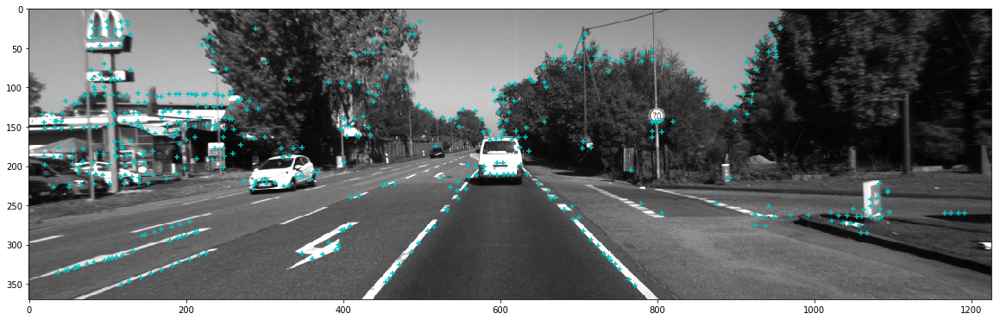

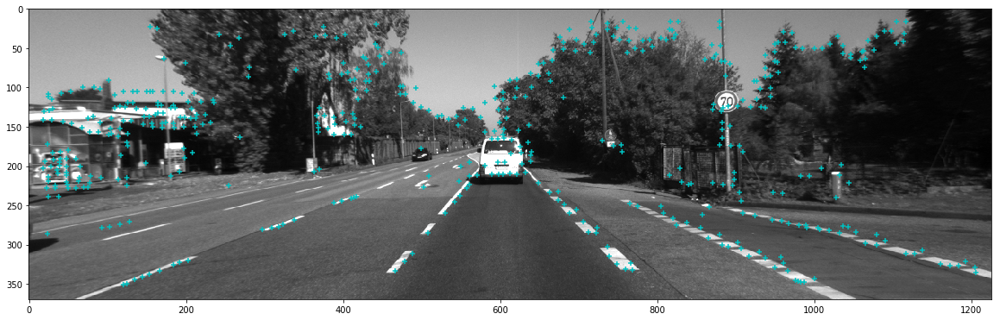

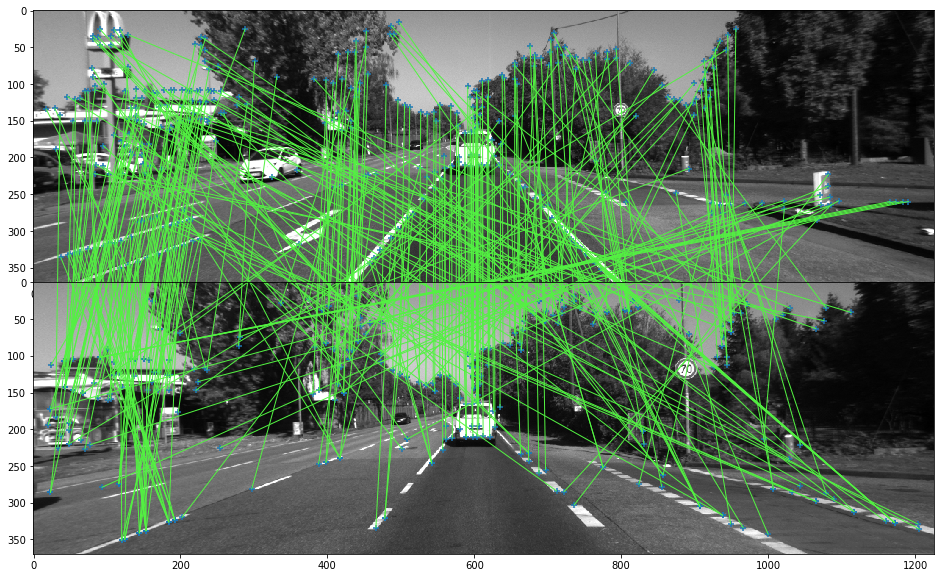

In [25]:
img1_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_30/2011_09_30_drive_0016_sync/image_00/data/0000000000.png'
img2_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_30/2011_09_30_drive_0016_sync/image_00/data/0000000005.png'
im1, im2, k1, k2, k2_corr, dist = get_corr(img1_fp, img2_fp)

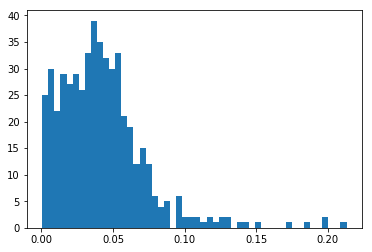

In [29]:
plt.hist(dist, bins=50)
plt.show()

59


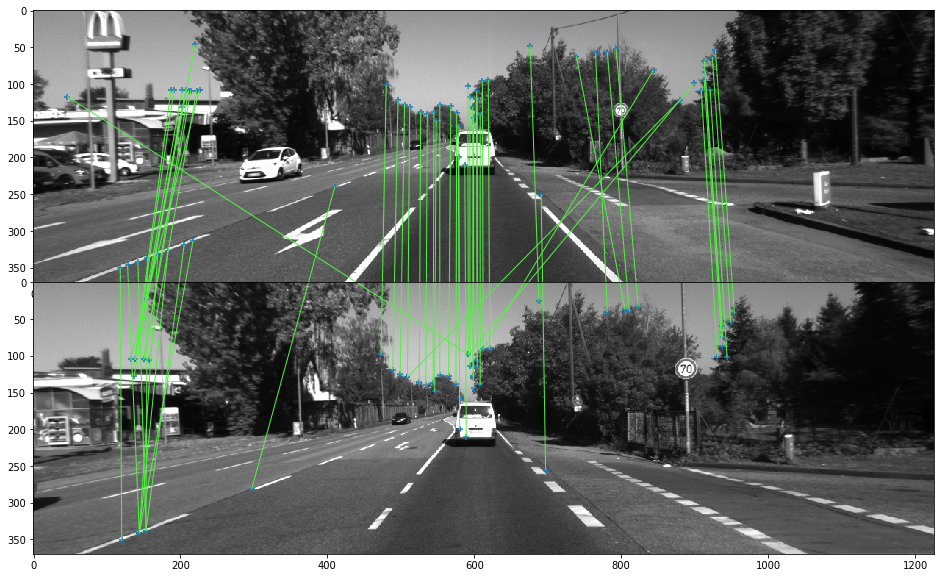

In [30]:
x = np.where(dist < 0.01)
a = k1[x[0]]
c = k2_corr[x[0]]
print(len(a))
plot_corr(im1, im2, a, c)

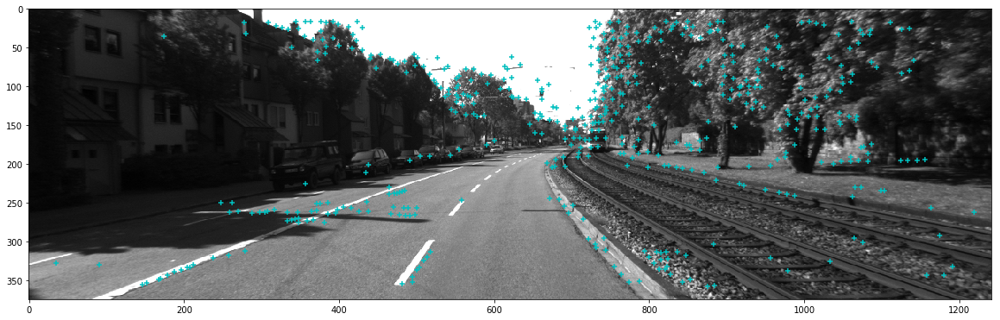

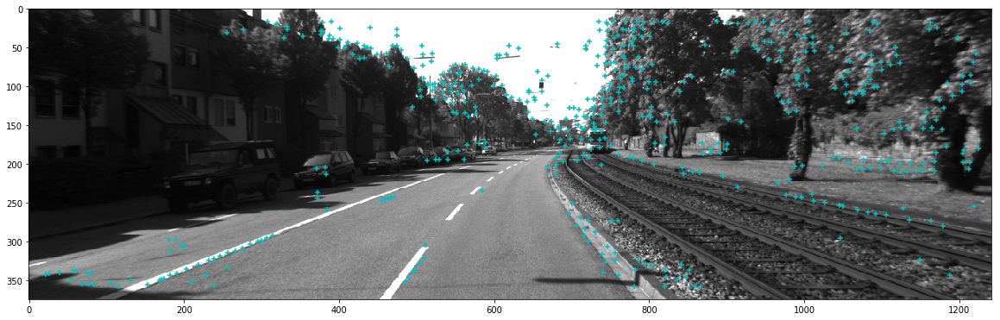

In [20]:
img1_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000000.png'
img2_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000005.png'
im1, im2, k1, k2, k2_corr, dist = get_corr(img1_fp, img2_fp)

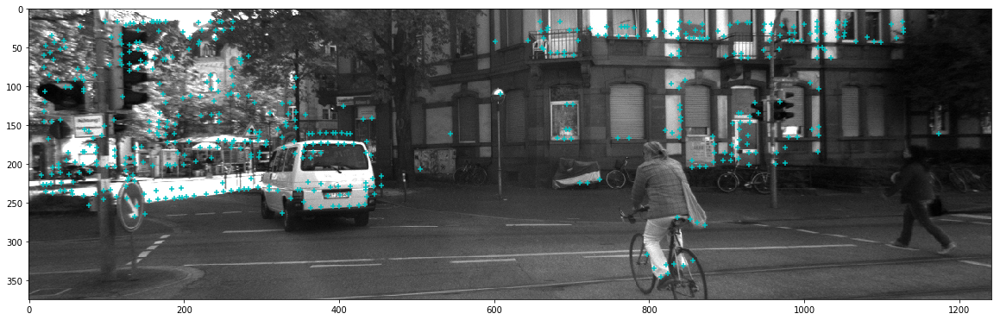

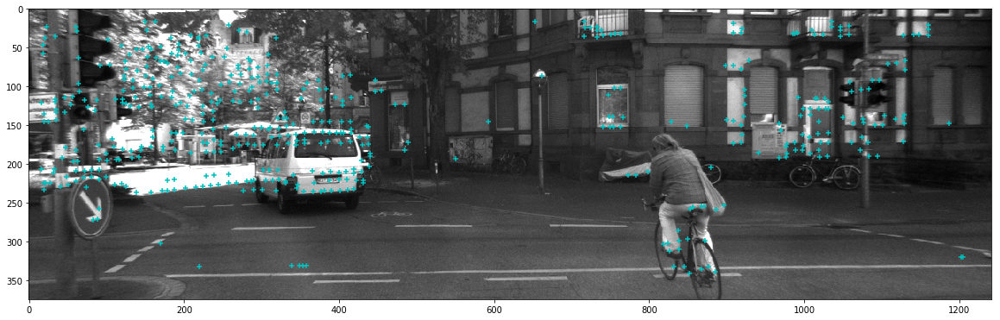

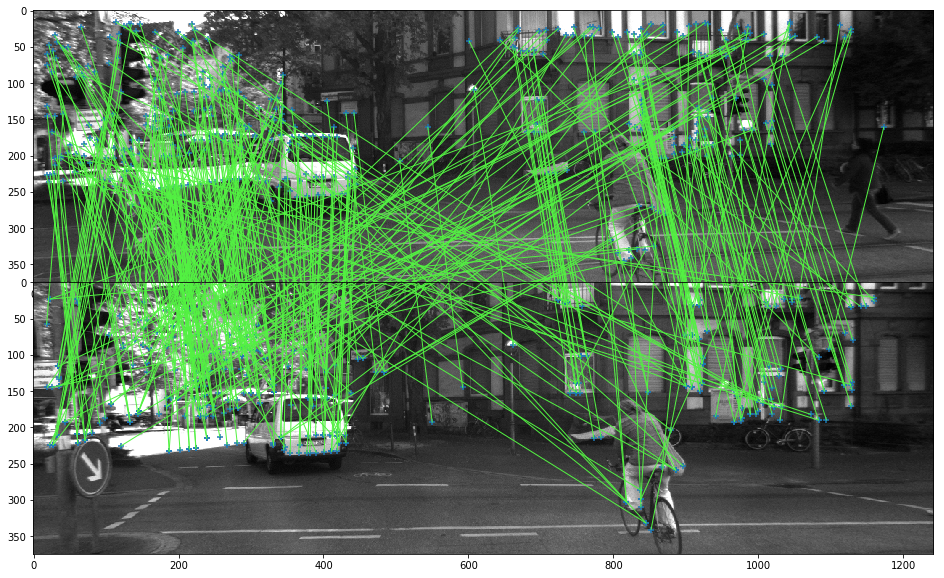

In [24]:
img1_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_26/2011_09_26_drive_0005_sync/image_00/data/0000000000.png'
img2_fp = '/Users/dewalgupta/Documents/ucsd/lab/data/KITTI/raw/2011_09_26/2011_09_26_drive_0005_sync/image_00/data/0000000005.png'
img1, img2, k1, k2, k2_corr, dist = get_corr(img1_fp, img2_fp)

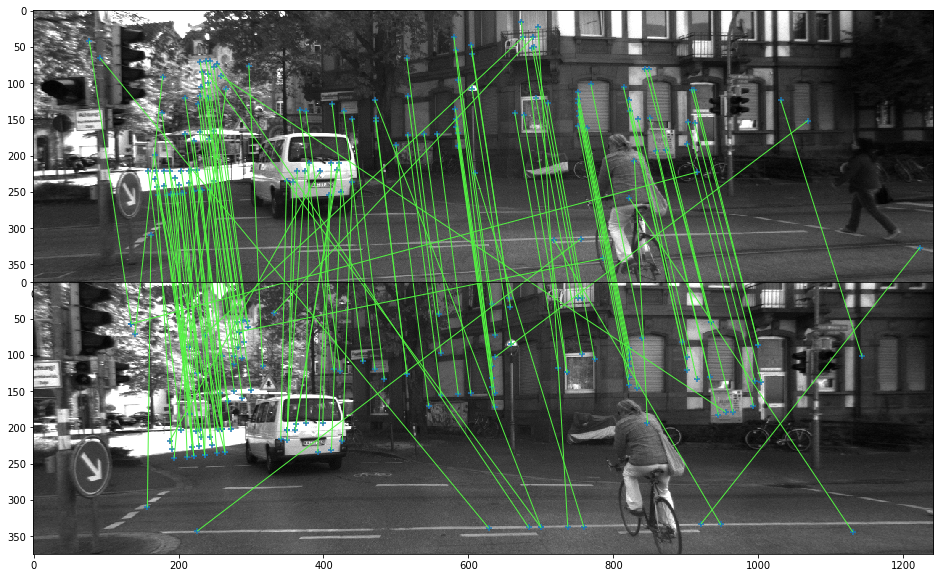

In [34]:
x = np.where(dist < 0.004)
a = k1[x[0]]
c = k2_corr[x[0]]
plot_corr(img1, img2, a, c)

/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


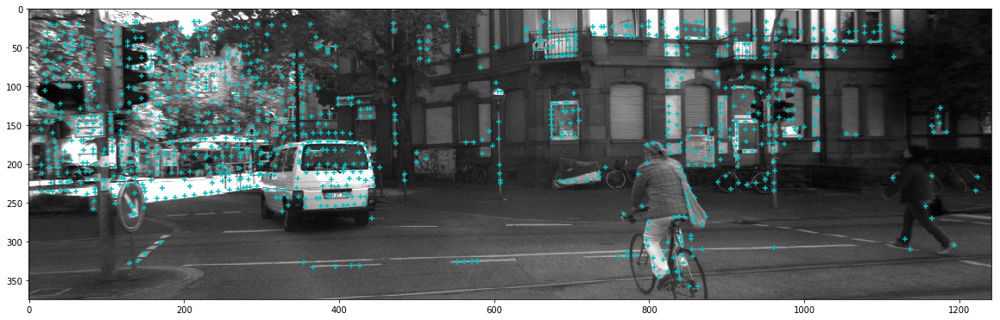

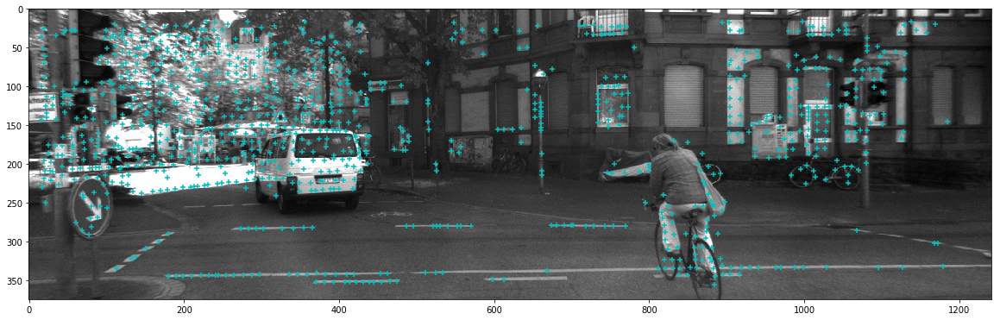

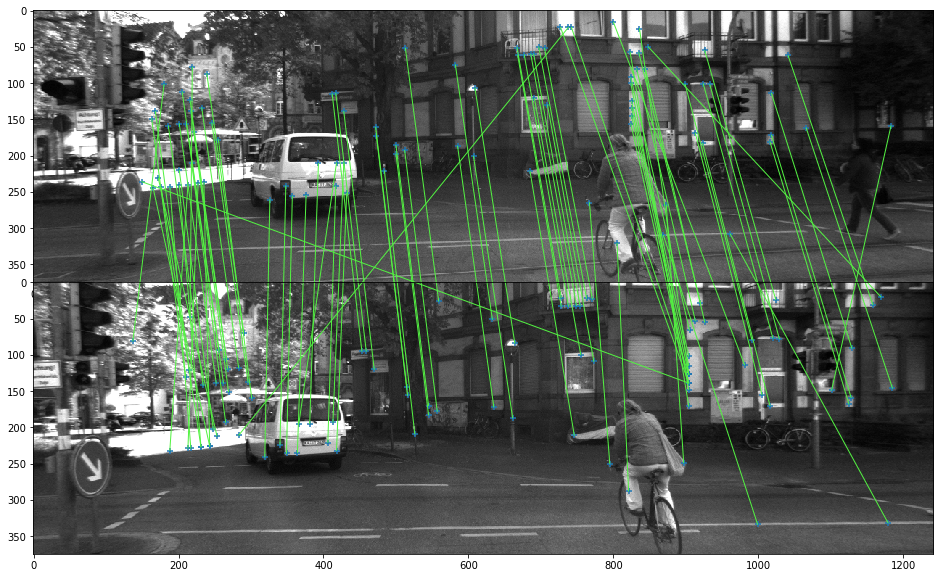

In [27]:
################################
# DO NOT RUN CELL
# THIS IS USING THE ORIGINAL LF-NET PRETRAINED WEIGHTS
################################
# img1_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/image_00/data/0000000000.png'
# img2_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/image_00/data/0000000005.png'
# plot_imgs(img1_fp, img2_fp)
# img1, img2, k1, k2, k2_corr, dist = get_corr(img1_fp, img2_fp)

/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  
/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


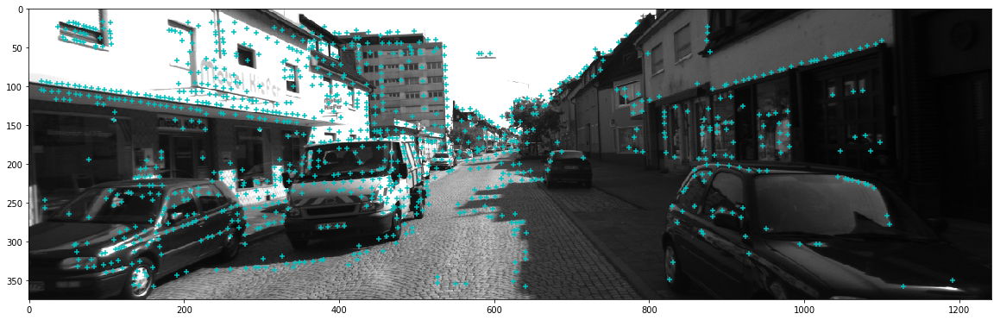

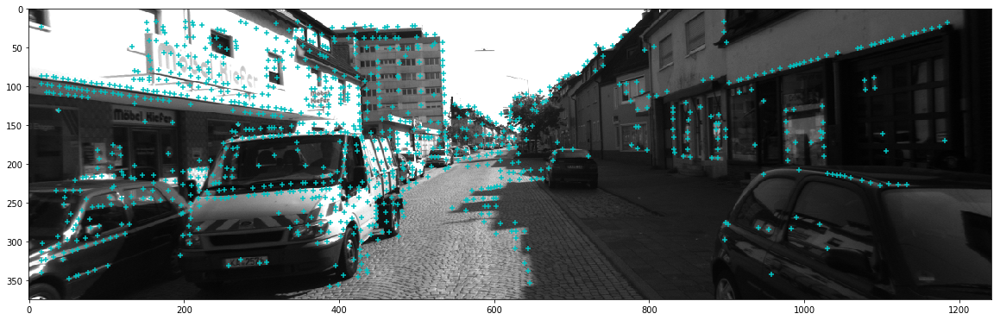

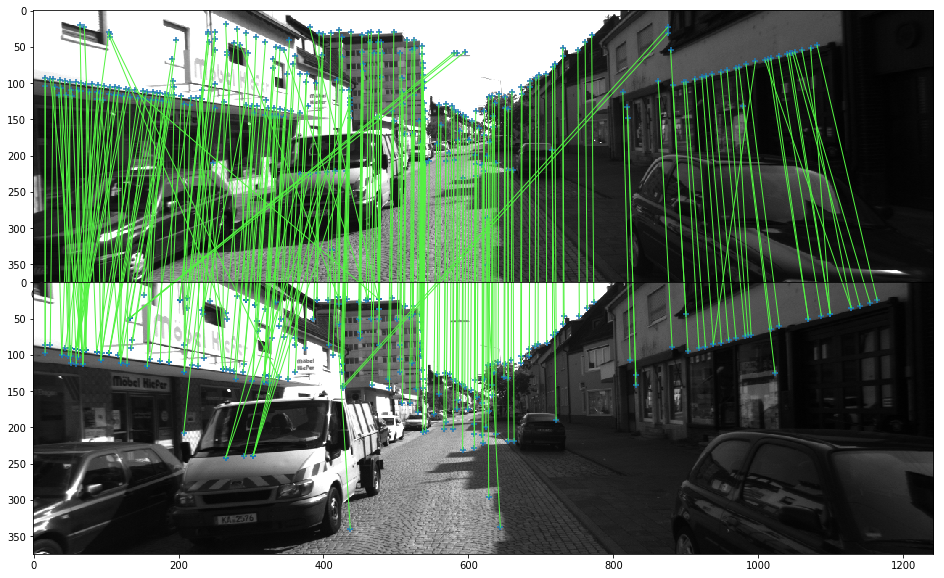

In [28]:
img1_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0048_sync/image_00/data/0000000000.png'
img2_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0048_sync/image_00/data/0000000002.png'
# plot_imgs(img1_fp, img2_fp)
img1, img2, k1, k2, k2_corr, dist = get_corr(img1_fp, img2_fp)
np.savez('example1.npz', img1=img1, img2=img2, kp1=k1, kp2=k2, corr=k2_corr, dist=dist)

<hr>
<h1>TEST CODE</h1>

In [16]:
img1_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000000.png'
img2_fp = '/data/kitti/raw/2011_09_26/2011_09_26_drive_0001_sync/image_00/data/0000000005.png'
img1 = misc.imread(img1_fp)
img2 = misc.imread(img2_fp)

feed_dict = {
    is_training: False,
    inp_img1: img1,
    inp_img2: img2,
}
fetch_dict = {
    'photos1': inp_img1,
    'photos2': inp_img2,
    'kpts1': kpts1,
    'kpts1_corr': kpts1_corr,
    'kpts2': kpts2,
    'kpts2_corr': kpts2_corr,
    'pts12_ind': nn_inds1t2,
    'pts21_ind': nn_inds2t1,
    'dist': nn_dist,
    'degree_maps1': degree_maps1,
    'degree_maps2': degree_maps2,
}
outs = sess.run(fetch_dict, feed_dict=feed_dict)

/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/home/dewal/lf-net-release/tf/lib/python3.5/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


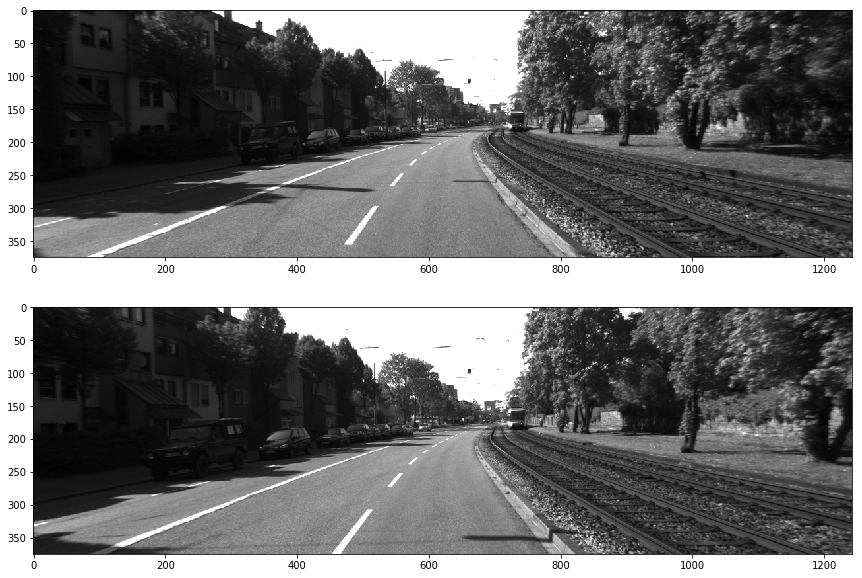

In [15]:
f, axarr = plt.subplots(2,1,figsize=(15,10))
axarr[0].imshow(outs['photos1'], cmap='gray')
axarr[1].imshow(outs['photos2'], cmap='gray')

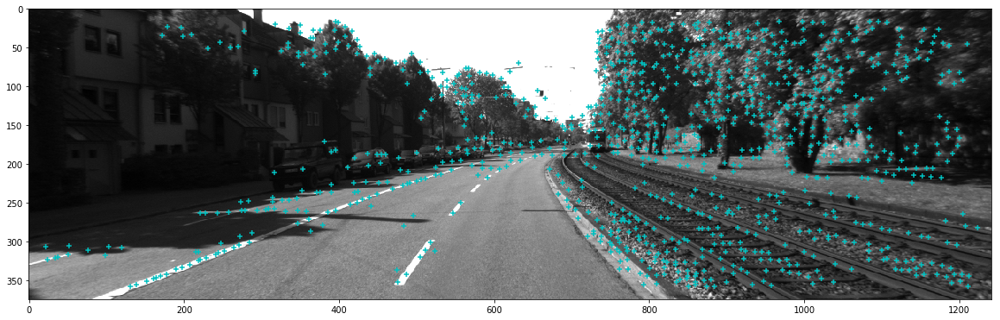

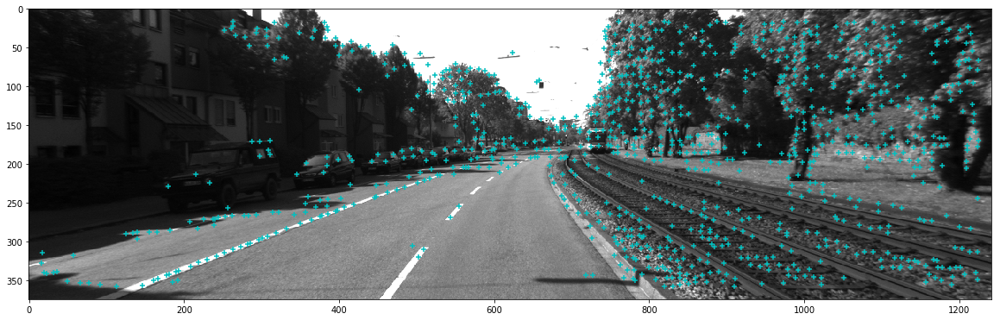

In [21]:
plot_img(outs['photos1'], outs['kpts1'])
plot_img(outs['photos2'], outs['kpts2'])

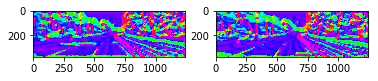

In [28]:
plt.subplot(121)
plt.imshow(outs['degree_maps1'][0])
plt.subplot(122)
plt.imshow(outs['degree_maps2'][0])

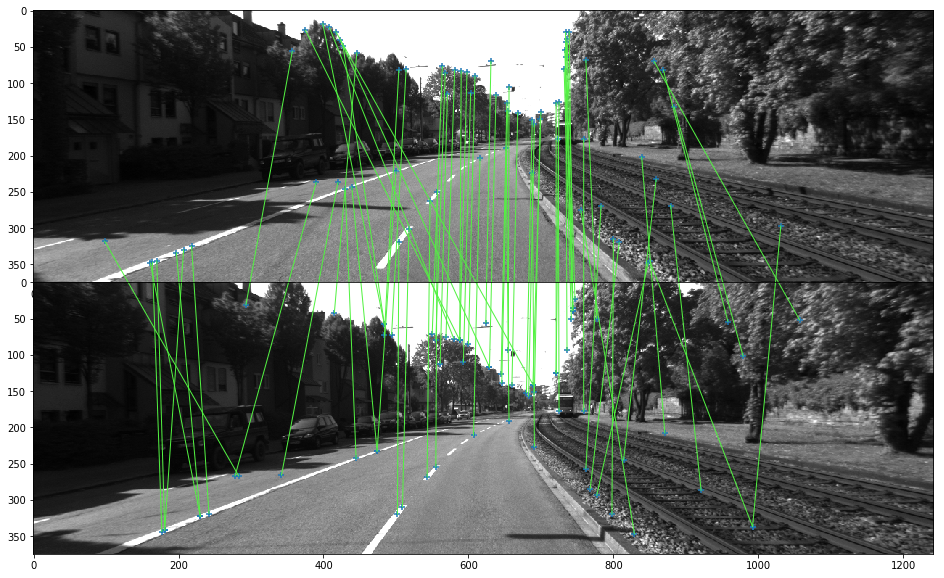

In [53]:
x = np.where(outs['dist'] < 0.04)
a = outs['kpts1'][x[0]]
c = outs['kpts2_corr'][x[0]]
plot_corr(outs['photos1'], outs['photos2'], a, c)

In [65]:
k1 = outs['kpts1']
k2 = outs['kpts2']
ind12 = outs['pts12_ind']
ind21 = outs['pts21_ind']
dist = outs['dist']

test = np.zeros((len(ind12)))
for i in range(len(ind12)):
    j = ind12[i]
    if ind21[j] == i:
        test[i] = 1
        
x = np.where(test)[0]
k1 = k1[x]
corr = ind12[x]
dist = dist[x]
k2 = k2[corr]

In [63]:
# the distance metric seems off? 
print(k1[0], k2[0], dist[0])
print(np.linalg.norm(k1[0]-k2[0]))

[1084.         16.000288] [1000.001      96.000114] 0.056655094
115.999176


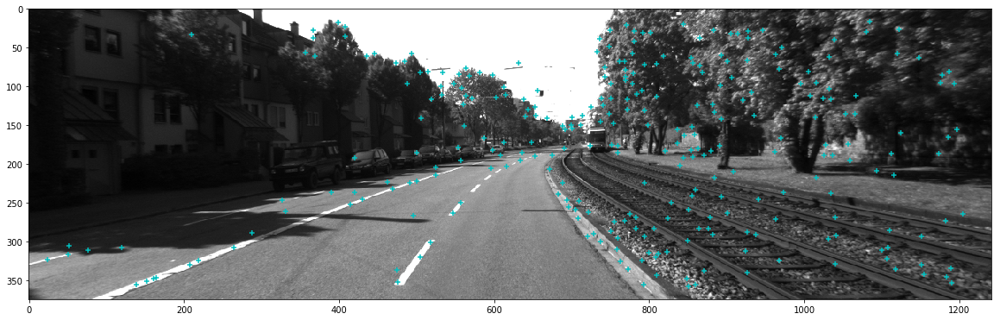

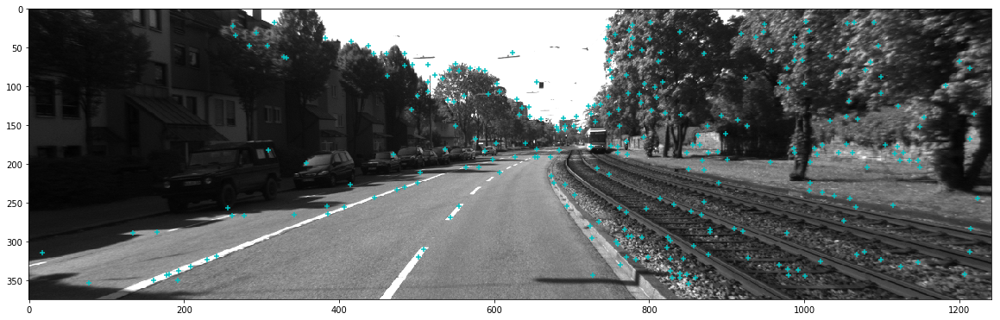

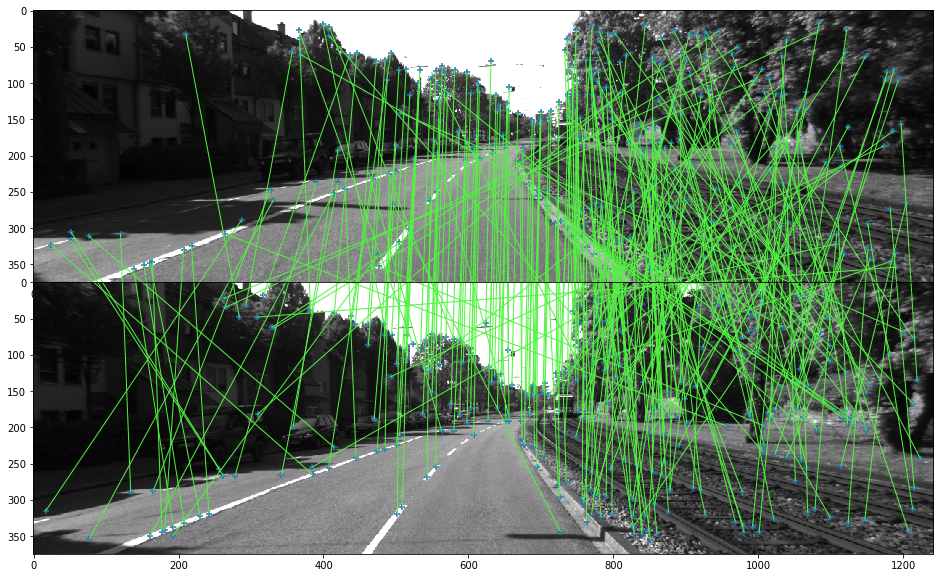

In [59]:
plot_img(outs['photos1'], k1)
plot_img(outs['photos2'], k2)
plot_corr(outs['photos1'], outs['photos2'], k1, k2)

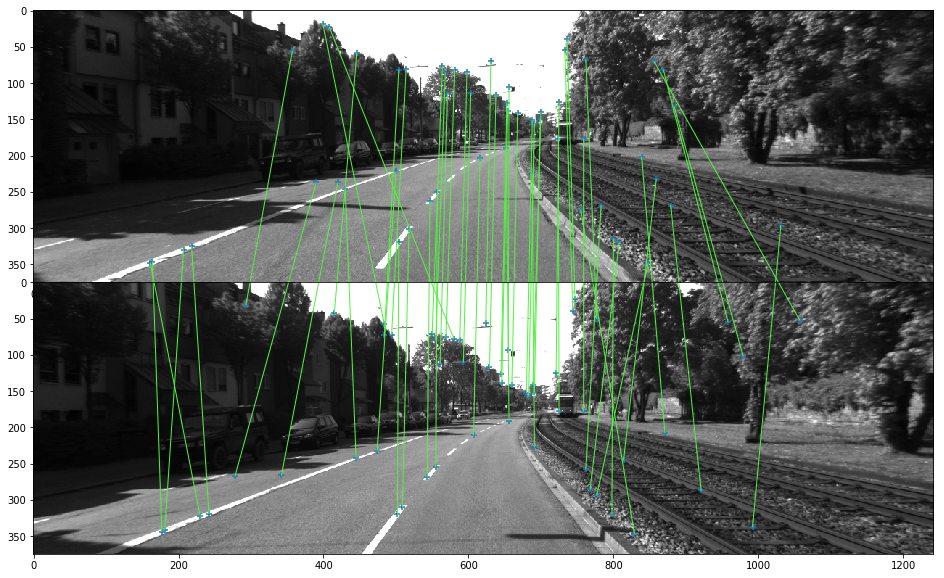

In [68]:
x = np.where(dist < 0.04)
a = k1[x[0]]
c = k2[x[0]]
plot_corr(outs['photos1'], outs['photos2'], a, c)

In [32]:
test = np.load('example1.npz')
test.files

['kp1', 'dist', 'img2', 'kp2', 'corr', 'img1']